In [3]:
############
# Imports #
############

import json
import os

import torch
import rasterio
import pandas as pd
import wandb
from torch.utils.data import DataLoader

from model.cnn_classifier import model_4D
from model.finetune import FinetuneLoop
from model.pseudomask import Pseudomasks
from model.train import ClassifierTrainLoop
from utils.data_modules import ImageDataset, TestSet, filter_dataset

In [4]:
testset_dir = '/Users/nadja/Documents/UU/Thesis/Data/Verified_GTs'
depth_layer = 'hs'
normalize = False
finetune = False

# test_set = TestSet(depth_layer, testset_dir, normalize)

# unfiltered_labels_df = pd.read_csv(testset_dir, index_col=0)
# test_set.labels_df = unfiltered_labels_df.loc[
#     (unfiltered_labels_df['difference']<10)]

# test_loader = DataLoader(test_set, batch_size=1, shuffle=True, num_workers=1)


In [5]:
unfiltered_labels_df = pd.read_csv( '/home/nadjaflechner/Palsa_data/generated_datasets/Verified_GTs/new_palsa_labels.csv', index_col=0)


FileNotFoundError: [Errno 2] No such file or directory: '/home/nadjaflechner/Palsa_data/generated_datasets/Verified_GTs/new_palsa_labels.csv'

In [7]:
unfiltered_labels_df.head()

,palsa_percentage,matthias_percentage,difference
757_69_5050_2014_crop_25,1.50,1.3950,0.1050
757_69_5050_2014_crop_26,0.50,0.0500,0.4500
757_69_5050_2014_crop_30,3.00,2.7900,0.2100
753_67_2550_2014_crop_36,1.25,0.0725,1.1775
753_67_2550_2014_crop_50,2.75,0.5700,2.1800


In [32]:
import os

import numpy as np
import pandas as pd
import rasterio
import torch
from torch.autograd import Variable
import torch.nn as nn
from torch.utils.data import Dataset
from torchvision import transforms
import matplotlib.pyplot as plt

class SaveFeatures():
    features=None
    def __init__(self,m): self.hook = m.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output): self.features = output
    def remove(self): self.hook.remove()


def plot_cam(filename, model):
        with rasterio.open(f"/Users/nadja/Documents/UU/Thesis/Data/Verified_GTs/rgb/{filename}.tif") as RGB_src:
        # Read the image data
            RGB_img = RGB_src.read()

        with rasterio.open(f"/Users/nadja/Documents/UU/Thesis/Data/Verified_GTs/hs/{filename}.tif") as hs_src:
            # Read the image data
            hs_img = hs_src.read()

        # convert and upsample hs image
        hs_image_array = np.array(hs_img)
        hs_image_tensor = torch.from_numpy(hs_image_array)
        hs_image_tensor = hs_image_tensor.float()
        bilinear = nn.Upsample(size=200*2, mode='bilinear')
        hs_upsampled_tensor = bilinear(hs_image_tensor.unsqueeze(0)).squeeze(0)

        # converting RGB to tensor
        RGB_image_array = np.array(RGB_img)
        RGB_image_tensor = torch.from_numpy(RGB_image_array)
        RGB_image_tensor = RGB_image_tensor.float()

        combined_tensor = torch.concatenate((RGB_image_tensor, hs_upsampled_tensor)).unsqueeze(dim=0)

        #get the last convolution
        sf = SaveFeatures(model.features[-2])
        im = Variable(combined_tensor)
        outputs = model(combined_tensor)

        # generate CAM
        sf.remove()
        arr = sf.features.cpu().detach()#.numpy()

        pals_acts = torch.nn.functional.interpolate(
            input = arr[:,1,:,:].unsqueeze(1),
            scale_factor = combined_tensor.shape[3]/arr.shape[3],
            mode='bilinear'
        ).cpu().detach()

        cpu_img = combined_tensor.squeeze().cpu().detach().permute(1,2,0).long().numpy()

        return cpu_img, pals_acts #,combined_tensor


In [7]:
unfiltered_labels_df = pd.read_csv( '/Users/nadja/Documents/UU/Thesis/Data/Verified_GTs/new_palsa_labels.csv', index_col=0)
labels = unfiltered_labels_df[unfiltered_labels_df["palsa_percentage"]>5].index


In [40]:
################
# define models 
################

api = wandb.Api()

# model_names = ['model:v38', 'model:v40', 'model:v45','classification_model:v88']
model_names = ['model:v38', 'model:v40', 'model:v45','classification_model:v106']
model_label = ['1e-3', '1e-4', '1e-5', '1e-6']

models = []
for modelname in model_names:
    artifact_path = f'nadjaflechner/VGG_CAMs/{modelname}'
    artifact = api.artifact(artifact_path)
    artifact_dir = artifact.download()
    state_dict = torch.load(f"{artifact_dir}/model.pth", map_location=torch.device('cpu'))
    model = model_4D()
    model.load_state_dict(state_dict)
    model.eval()
    models.append(model)

wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  


/var/folders/wm/j23cgbjn0m15n_64hfkt3n500000gn/T/ipykernel_80346/375803856.py:24: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


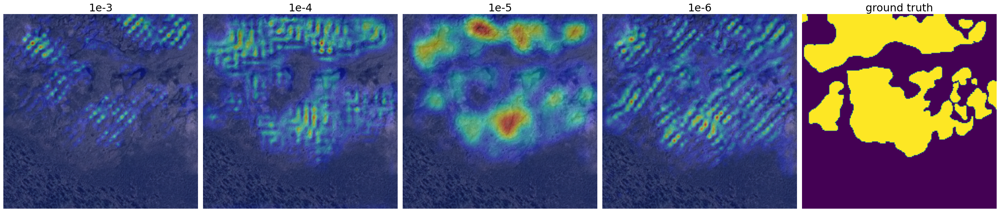

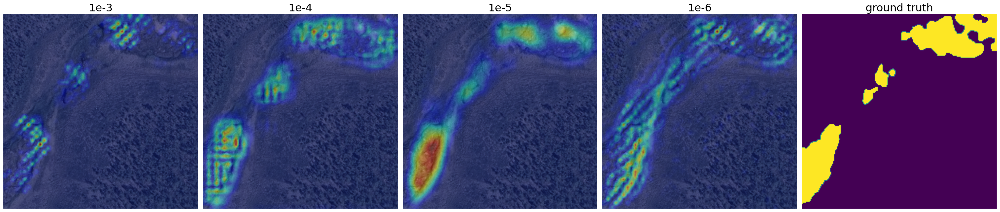

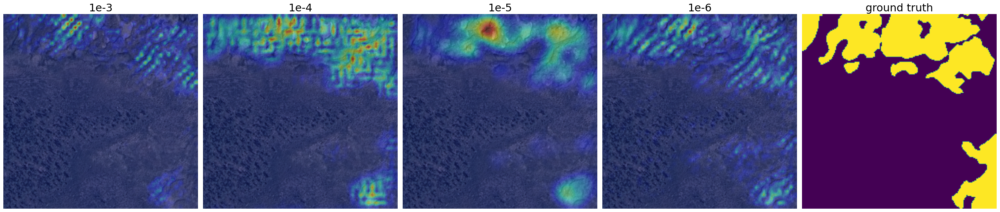

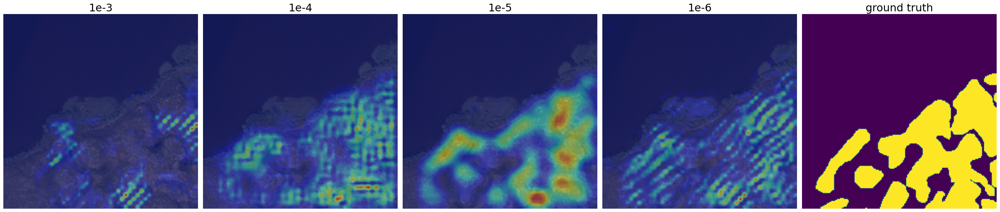

In [41]:
#############
# Plotting
#############

for file_idx in [0,2,3,17]: 

    filename = labels[file_idx]

    fig, ax = plt.subplots(1,len(models)+1, figsize = (6+6*len(models),8))

    for idx, model in enumerate(models):
        cpu_img, pals_acts = plot_cam(filename, model)
        ax[idx].imshow(cpu_img[:,:,:3])
        ax[idx].imshow(pals_acts.view(pals_acts.shape[3], pals_acts.shape[3], 1), alpha=.4, cmap='jet')
        ax[idx].axis('off')
        ax[idx].set_title(model_label[idx],fontsize=23)

    GT = rasterio.open(f"/Users/nadja/Documents/UU/Thesis/Data/Verified_GTs/groundtruth_mask/{filename}.tif").read()
    ax[len(models)].imshow(np.transpose(GT, (1,2,0)))
    ax[len(models)].axis('off')
    ax[len(models)].set_title('ground truth',fontsize=23)

    fig.tight_layout()
    fig.show()
    fig.savefig(f'/Users/nadja/Documents/UU/Thesis/Permafrost-Segmentation/analysis/lr/{file_idx}_new.png')

In [ ]:
potential_imgs = ['753_67_2550_2014_crop_51','753_67_2550_2014_crop_61','753_67_2550_2014_crop_62', '760_74_5025_2018_crop_48']
labels_idx = [0,2,3,17]

BEST ='753_67_2550_2014_crop_61'

In [23]:
artifact_path = 'nadjaflechner/VGG_CAMs/model:v31'

api = wandb.Api()
artifact = api.artifact(artifact_path)
artifact_dir = artifact.download()

state_dict = torch.load(f"{artifact_dir}/model.pth", map_location=torch.device('cpu'))
model = model_4D()
model.load_state_dict(state_dict)
model.eval()



wandb:   1 of 1 files downloaded.  


model_4D(
  (features): Sequential(
    (0): Conv2d(4, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (11): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): ReLU(inplace=True)
    (14): Conv2d(

100%|██████████| 1/1 [00:03<00:00,  3.19s/it]


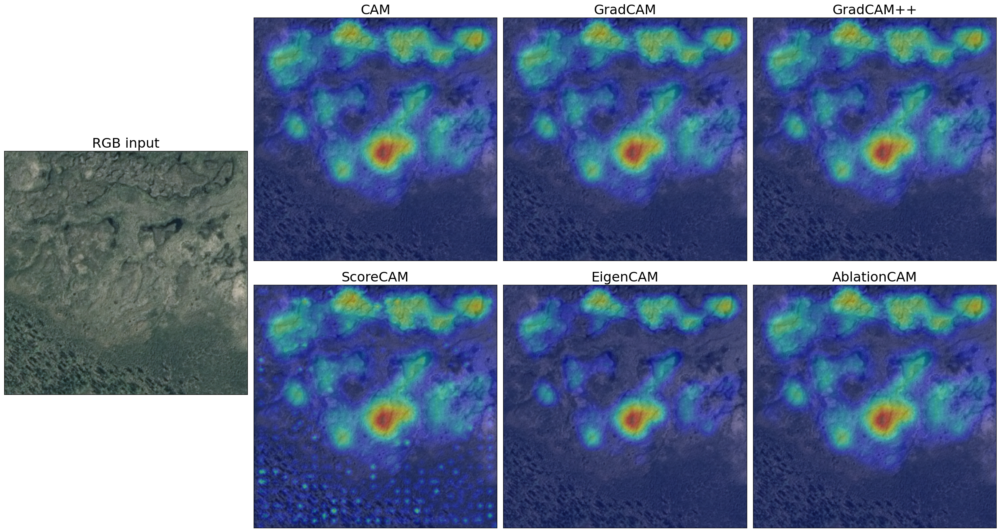

In [31]:
from utils.data_modules import SaveFeatures
from torch.autograd import Variable
import matplotlib.pyplot as plt
from pytorch_grad_cam import GradCAM, ScoreCAM, EigenCAM, GradCAMPlusPlus, AblationCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
import numpy as np

filename = '753_67_2550_2014_crop_51'

cpu_img, pals_acts, combined_tensor = plot_cam(filename, model)

# Initiate all CAMs
target_layers = [model.features[-2]]  # Use the last convolutional layer
gradcam = GradCAM(model=model, target_layers=target_layers)
scorecam = ScoreCAM(model=model, target_layers=target_layers)
eigencam = EigenCAM(model=model, target_layers=target_layers)
gradcamplusplus = GradCAMPlusPlus(model=model, target_layers=target_layers)
ablationcam = AblationCAM(model=model, target_layers=target_layers)

fig = plt.figure(figsize=(24, 13))
gs = fig.add_gridspec(2, 4)

ax = [
    fig.add_subplot(gs[:, 0]),
    fig.add_subplot(gs[0, 1]),
    fig.add_subplot(gs[0, 2]),
    fig.add_subplot(gs[0, 3]),
    fig.add_subplot(gs[1, 1]),
    fig.add_subplot(gs[1, 2]),
    fig.add_subplot(gs[1, 3])
]

ax[0].imshow(cpu_img[:,:,:3])
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_title(f'RGB input', fontsize = 23)

ax[1].imshow(cpu_img[:,:,:3])
ax[1].imshow(pals_acts.view(pals_acts.shape[3], pals_acts.shape[3], 1), alpha=.4, cmap='jet')
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_title(f'CAM', fontsize = 23)

cams = [gradcam, gradcamplusplus, scorecam, eigencam, ablationcam]
cams_strs = ['GradCAM',  'GradCAM++', 'ScoreCAM', 'EigenCAM', 'AblationCAM']
axs = [2,3,4,5,6]

for cam, name, axis in zip (cams, cams_strs, axs):
    activation_map = cam(input_tensor=combined_tensor, targets = [ClassifierOutputTarget(1)])
    ax[axis].imshow(cpu_img[:,:,:3])
    ax[axis].imshow(np.transpose(activation_map, (1,2,0)), alpha=.4, cmap='jet')
    ax[axis].set_xticks([])
    ax[axis].set_yticks([])
    ax[axis].set_title(name, fontsize = 23)

fig.tight_layout()
